# Single Neural Style Transfer

Based on https://arxiv.org/abs/1603.08155

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import numpy as np
from pathlib import Path
import time
import os

In [ ]:
# global configs
COCO_ROOT = '/kaggle/input/coco-2017-dataset/coco2017/'
COCO_TRAIN_IMAGES = f'{COCO_ROOT}train2017'
STYLE_IMAGE_PATH = '/kaggle/input/style-dataset/style_image_v2.jpg'
OUTPUT_DIR = '/kaggle/working/'

# Training Parameters
NUM_IMAGES = 20000
BATCH_SIZE = 6
IMAGE_SIZE = 256
EPOCHS = 2
LEARNING_RATE = 1e-3
CONTENT_WEIGHT = 12  # Using your specified weight
STYLE_WEIGHT = 60    # Using your specified weight

# Model will be saved every SAVE_INTERVAL batches
SAVE_INTERVAL = 2000
LOG_INTERVAL = 300

# Device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

os.makedirs(f"{OUTPUT_DIR}models/", exist_ok=True)
os.makedirs(f"{OUTPUT_DIR}images/out/", exist_ok=True)

In [ ]:
# dataset loading
class COCODataset(Dataset):
    """COCO Dataset for style transfer training"""
    def __init__(self, img_dir, transform, max_images=None):
        self.img_dir = Path(img_dir)
        self.transform = transform
        
        # Get all image files
        self.image_files = sorted(list(self.img_dir.glob('*.jpg')))
        
        if max_images:
            self.image_files = self.image_files[:max_images]
        
        print(f"Loaded {len(self.image_files)} images")
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        try:
            img = Image.open(img_path).convert('RGB')
            img = self.transform(img)
            return img
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            return self.__getitem__((idx + 1) % len(self))

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.mul(255))  # scale to [0, 255]
])

In [ ]:
# transformer network
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, norm="instance"):
        super(ConvLayer, self).__init__()
        # Reflection padding
        padding_size = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(padding_size)
        
        # Convolution Layer
        self.conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size, stride)
        
        # Normalization Layers
        self.norm_type = norm
        if norm == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)
    
    def forward(self, x):
        x = self.reflection_pad(x)
        x = self.conv_layer(x)
        if self.norm_type == "None":
            out = x
        else:
            out = self.norm_layer(x)
        return out

class ResidualLayer(nn.Module):
    """Residual block matching original implementation"""
    def __init__(self, channels=128, kernel_size=3):
        super(ResidualLayer, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size, stride=1)
        self.relu = nn.ReLU()
        self.conv2 = ConvLayer(channels, channels, kernel_size, stride=1)
    
    def forward(self, x):
        identity = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out)
        out = out + identity
        return out

class DeconvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, output_padding, norm="instance"):
        super(DeconvLayer, self).__init__()
        
        # Transposed Convolution
        padding_size = kernel_size // 2
        self.conv_transpose = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, 
                                                  stride, padding_size, output_padding)
        
        # Normalization Layers
        self.norm_type = norm
        if norm == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif norm == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)
    
    def forward(self, x):
        x = self.conv_transpose(x)
        if self.norm_type == "None":
            out = x
        else:
            out = self.norm_layer(x)
        return out

class TransformerNetwork(nn.Module):
    """Feedforward Transformation Network without Tanh
    Matches the original implementation exactly
    """
    def __init__(self):
        super(TransformerNetwork, self).__init__()
        self.ConvBlock = nn.Sequential(
            ConvLayer(3, 32, 9, 1),
            nn.ReLU(),
            ConvLayer(32, 64, 3, 2),
            nn.ReLU(),
            ConvLayer(64, 128, 3, 2),
            nn.ReLU()
        )
        self.ResidualBlock = nn.Sequential(
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3),
            ResidualLayer(128, 3)
        )
        self.DeconvBlock = nn.Sequential(
            DeconvLayer(128, 64, 3, 2, 1),
            nn.ReLU(),
            DeconvLayer(64, 32, 3, 2, 1),
            nn.ReLU(),
            ConvLayer(32, 3, 9, 1, norm="None")
        )
    
    def forward(self, x):
        x = self.ConvBlock(x)
        x = self.ResidualBlock(x)
        out = self.DeconvBlock(x)
        return out

In [ ]:
class VGG16(nn.Module):
    """VGG16 using pretrained ImageNet weights"""
    def __init__(self):
        super(VGG16, self).__init__()
        # Load pretrained VGG16
        vgg16_features = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
        self.features = vgg16_features.features
        
        # Turn-off Gradient History
        for param in self.features.parameters():
            param.requires_grad = False
    
    def forward(self, x):
        layers = {'3': 'relu1_2', '8': 'relu2_2', '15': 'relu3_3', '22': 'relu4_3'}
        features = {}
        for name, layer in self.features._modules.items():
            x = layer(x)
            if name in layers:
                features[layers[name]] = x
                if name == '22':
                    break
        return features

In [ ]:
# util funcitons
ef gram_matrix(tensor):
    """Compute Gram matrix"""
    B, C, H, W = tensor.shape
    x = tensor.view(B, C, H * W)
    x_t = x.transpose(1, 2)
    return torch.bmm(x, x_t) / (C * H * W)

def save_checkpoint(model, batch_count, output_dir):
    """Save model checkpoint"""
    checkpoint_path = f"{output_dir}models/checkpoint_{batch_count}.pth"
    torch.save(model.state_dict(), checkpoint_path)
    print(f"Saved checkpoint at {checkpoint_path}")

def save_sample_image(tensor, batch_count, output_dir):
    """Save sample stylized image"""
    # Take first image from batch
    img = tensor[0].clone().detach()
    # Convert from [C, H, W] to [H, W, C]
    img = img.cpu().numpy().transpose(1, 2, 0)
    # Clip to valid range
    img = np.clip(img, 0, 255).astype(np.uint8)
    # Convert to PIL and save
    img_pil = Image.fromarray(img)
    save_path = f"{output_dir}images/out/sample_{batch_count}.png"
    img_pil.save(save_path)
    print(f"Saved sample image at {save_path}")

In [35]:
def train():
    print("Loading dataset...")
    dataset = COCODataset(COCO_TRAIN_IMAGES, transform, max_images=NUM_IMAGES)
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, 
                          num_workers=2, pin_memory=True)
    
    print("Loading style image...")
    style_img = Image.open(STYLE_IMAGE_PATH).convert('RGB')
    style_img = transform(style_img).unsqueeze(0).to(DEVICE)
    
    print("Initializing networks...")
    TransformerNet = TransformerNetwork().to(DEVICE)
    VGG = VGG16().to(DEVICE)
    VGG.eval()
    
    # ImageNet normalization for VGG (BGR format, negative mean)
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], 
                                     dtype=torch.float32).reshape(1, 3, 1, 1).to(DEVICE)
    
    print("Extracting style features...")
    with torch.no_grad():
        style_tensor = style_img.add(imagenet_neg_mean)
        B, C, H, W = style_tensor.shape
        style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
        style_grams = {}
        for key, value in style_features.items():
            style_grams[key] = gram_matrix(value)
    
    optimizer = optim.Adam(TransformerNet.parameters(), lr=LEARNING_RATE)
    
    # loss trackers
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0
    
    # training loop
    print(f"Starting training for {EPOCHS} epochs...")
    batch_count = 1
    start_time = time.time()
    
    for epoch in range(EPOCHS):
        print(f"========Epoch {epoch+1}/{EPOCHS}========")
        
        for content_batch in dataloader:
            curr_batch_size = content_batch.shape[0]
            
            torch.cuda.empty_cache()
            optimizer.zero_grad()
            
            # Convert RGB to BGR and move to device
            content_batch = content_batch[:, [2, 1, 0]].to(DEVICE)
            
            # generate stylized images
            generated_batch = TransformerNet(content_batch)
            
            # extract features
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))
            
            # Content Loss (from relu2_2 layer)
            MSELoss = nn.MSELoss().to(DEVICE)
            content_loss = CONTENT_WEIGHT * MSELoss(generated_features['relu2_2'], 
                                                    content_features['relu2_2'])
            batch_content_loss_sum += content_loss.item()
            
            # Style Loss (from all layers)
            style_loss = 0
            for key, value in generated_features.items():
                generated_gram = gram_matrix(value)
                style_gram = style_grams[key][:curr_batch_size]
                s_loss = MSELoss(generated_gram, style_gram)
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss.item()
            
            # total loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()
            
            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()
            
            # logs
            if batch_count % LOG_INTERVAL == 0:
                avg_content = batch_content_loss_sum / batch_count
                avg_style = batch_style_loss_sum / batch_count
                avg_total = batch_total_loss_sum / batch_count
                elapsed = time.time() - start_time
                print(f"Iteration {batch_count}/{EPOCHS*len(dataloader)}")
                print(f"  Content Loss: {avg_content:.2f}")
                print(f"  Style Loss:   {avg_style:.2f}")
                print(f"  Total Loss:   {avg_total:.2f}")
                print(f"  Time elapsed: {elapsed:.0f} seconds")
            
            # checkpoint saving
            if (batch_count % SAVE_INTERVAL == 0) or (batch_count == EPOCHS * len(dataloader)):
                print(f"========Iteration {batch_count}/{EPOCHS*len(dataloader)}========")
                print(f"  Content Loss: {batch_content_loss_sum/batch_count:.2f}")
                print(f"  Style Loss:   {batch_style_loss_sum/batch_count:.2f}")
                print(f"  Total Loss:   {batch_total_loss_sum/batch_count:.2f}")
                print(f"Time elapsed: {time.time()-start_time:.0f} seconds")
                
                save_checkpoint(TransformerNet, batch_count, OUTPUT_DIR)
                save_sample_image(generated_batch, batch_count, OUTPUT_DIR)
            
            batch_count += 1
    
    # Save final model
    print("\nDone Training the Transformer Network!")
    print(f"Training Time: {time.time()-start_time:.0f} seconds")
    
    TransformerNet.eval()
    TransformerNet.cpu()
    final_path = f"{OUTPUT_DIR}models/transformer_weight_final.pth"
    torch.save(TransformerNet.state_dict(), final_path)
    print(f"Saved final model to {final_path}")

Using device: cuda


In [36]:
train()

Loading dataset...
Loaded 20000 images
Loading style image...
Initializing networks...
Extracting style features...
Starting training for 2 epochs...
========Epoch 1/2========
Iteration 300/6668
  Content Loss: 375015.74
  Style Loss:   1717623.36
  Total Loss:   2092639.09
  Time elapsed: 69 seconds
Iteration 600/6668
  Content Loss: 387569.24
  Style Loss:   1036737.75
  Total Loss:   1424307.00
  Time elapsed: 139 seconds
Iteration 900/6668
  Content Loss: 391848.33
  Style Loss:   779143.64
  Total Loss:   1170991.97
  Time elapsed: 208 seconds
Iteration 1200/6668
  Content Loss: 392478.97
  Style Loss:   640561.22
  Total Loss:   1033040.19
  Time elapsed: 278 seconds
Iteration 1500/6668
  Content Loss: 389752.53
  Style Loss:   553029.54
  Total Loss:   942782.07
  Time elapsed: 347 seconds
Iteration 1800/6668
  Content Loss: 385876.41
  Style Loss:   491038.36
  Total Loss:   876914.76
  Time elapsed: 416 seconds
========Iteration 2000/6668========
  Content Loss: 382769.20
  St

In [ ]:
def stylize_image(model_path, input_image_path, output_path):
    """Apply style transfer to a single image"""
    # Load model
    transform_net = TransformerNetwork().to(DEVICE)
    transform_net.load_state_dict(torch.load(model_path))
    transform_net.eval()
    
    # Transform for inference
    inference_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    
    # Load and preprocess image
    img = Image.open(input_image_path).convert('RGB')
    original_size = img.size
    img_tensor = inference_transform(img).unsqueeze(0)
    
    # Convert RGB to BGR
    img_tensor = img_tensor[:, [2, 1, 0]].to(DEVICE)
    
    # Apply style transfer
    with torch.no_grad():
        stylized = transform_net(img_tensor)
    
    # Convert back to RGB and numpy
    stylized = stylized[:, [2, 1, 0]].squeeze(0).cpu().numpy()
    stylized = stylized.transpose(1, 2, 0)
    stylized = np.clip(stylized, 0, 255).astype(np.uint8)
    
    # Convert to PIL and resize to original size
    stylized_pil = Image.fromarray(stylized)
    stylized_pil = stylized_pil.resize(original_size, Image.BICUBIC)
    stylized_pil.save(output_path)
    print(f"Stylized image saved to {output_path}")
    
    return stylized_pil

Stylized image saved to /kaggle/working/output_stylized.jpg


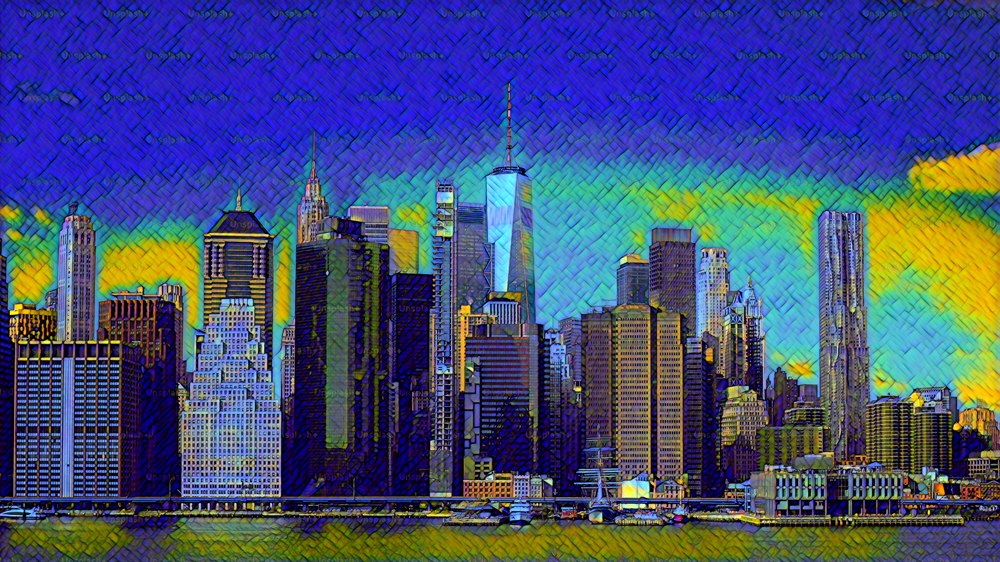

In [37]:
stylize_image(
    model_path='/kaggle/working/models/transformer_weight_final.pth',
    input_image_path="/kaggle/input/content-image/city_photo.jpg",
    output_path='/kaggle/working/output_stylized.jpg'
)